# Data Description

zomato_df_final_data is the real-world dataset from Zomato, which contains more than 10K observations for restaurants in the Sydney area. Zomato, an Indian-founded restaurant aggregator, left Australia in February 2023 after struggling during the COVID-19 pandemic. The purpose of this project is to help customers understand what factors make a restaurant good or bad, and to help them explore restaurants around them, for example, which suburb has the most Chinese restaurants.




| Column         | Description                             | Example                                 |
|----------------|-----------------------------------------|-----------------------------------------|
| `address`      | restaurant's address (text)             | 371A Pitt Street, CBD, Sydney           |
| `cost`         | the average cost for two people in AUD (numeric) | 50.0                                  |
| `cuisine`      | cuisines served by the restaurant (list) | [Thai, Salad]                          |
| `lat`          | Latitude (numeric)                      | -33.876059                              |
| `link`         | Url (text)                              | [https://www.zomato.com/sydney/sydney-madang-cbd](https://www.zomato.com/sydney/sydney-madang-cbd) |
| `lng`          | longitude (numeric)                     | 151.207605                              |
| `phone`        | phone number (numeric)                  | 02 8318 0406                            |
| `rating_number`| restaurant rating (numeric)             | 4.0                                     |
| `rating_text`  | restaurant rating (text)                | Very Good                               |
| `subzone`      | The suburb in which restaurant resides (text) | CBD                                   |
| `title`        | restaurant’s name (text)                | Sydney Madang                           |
| `type`         | business type (list)                    | [Casual Dining]                         |
| `votes`        | Number of users who provided the rating (numeric) | 1311.0                               |
| `groupon`      | is the restaurant promoting itself on Groupon.com? (boolean) | False          |


In [126]:
#load all packages
import pandas as pd
import warnings
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import plotly.express as px
import missingno as msno
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression, SGDRegressor, LogisticRegression
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, confusion_matrix, classification_report
from sklearn.neural_network import MLPClassifier

In [127]:
#load the data
df = pd.read_csv('data/zomato_df_final_data.csv')
warnings.filterwarnings("ignore")

# Part A –Importing and Understanding Data

In [128]:
#check the features
df.columns

Index(['address', 'cost', 'cuisine', 'lat', 'link', 'lng', 'phone',
       'rating_number', 'rating_text', 'subzone', 'title', 'type', 'votes',
       'groupon', 'color', 'cost_2', 'cuisine_color'],
      dtype='object')

In [129]:
#checking data
df.head(5)

,address,cost,cuisine,lat,link,lng,phone,rating_number,rating_text,subzone,title,type,votes,groupon,color,cost_2,cuisine_color
0,"371A Pitt Street, CBD, Sydney",50.0,"['Hot Pot', 'Korean BBQ', 'BBQ', 'Korean']",-33.876059,https://www.zomato.com/sydney/sydney-madang-cbd,151.207605,02 8318 0406,4.0,Very Good,CBD,Sydney Madang,['Casual Dining'],1311.0,False,#e15307,5.243902,#6f706b
1,"Shop 7A, 2 Huntley Street, Alexandria, Sydney",80.0,"['Cafe', 'Coffee and Tea', 'Salad', 'Poké']",-33.910999,https://www.zomato.com/sydney/the-grounds-of-a...,151.193793,02 9699 2225,4.6,Excellent,"The Grounds of Alexandria, Alexandria",The Grounds of Alexandria Cafe,['Café'],3236.0,False,#9c3203,7.560976,#6f706b
2,"Level G, The Darling at the Star, 80 Pyrmont ...",120.0,['Japanese'],-33.867971,https://www.zomato.com/sydney/sokyo-pyrmont,151.195210,1800 700 700,4.9,Excellent,"The Star, Pyrmont",Sokyo,['Fine Dining'],1227.0,False,#7f2704,10.650407,#6f706b
3,"Sydney Opera House, Bennelong Point, Circular...",270.0,['Modern Australian'],-33.856784,https://www.zomato.com/sydney/bennelong-restau...,151.215297,02 9240 8000,4.9,Excellent,Circular Quay,Bennelong Restaurant,"['Fine Dining', 'Bar']",278.0,False,#7f2704,22.235772,#4186f4
4,"20 Campbell Street, Chinatown, Sydney",55.0,"['Thai', 'Salad']",-33.879035,https://www.zomato.com/sydney/chat-thai-chinatown,151.206409,02 8317 4811,4.5,Excellent,Chinatown,Chat Thai,['Casual Dining'],2150.0,False,#a83703,5.630081,#6f706b


cost_2 is a different form of the cost column. color and cuisine_color are probably used to identify the restaurant on the map or graph, which is not meaningful for designing the model to predict rating.

## Provide plots/graphs to support:

### How many unique cuisines are served by Sydney restaurants?

In [130]:
# convert into actual lists
cuisine_ls = df['cuisine'].apply(lambda x: eval(x))

#get all cuisine from the all lists
all_cuisines = []
for sublist in cuisine_ls:
    if isinstance(sublist, list):
        for cuisine in sublist:
            all_cuisines.append(cuisine)

# unique cuisines using set
unique_cuisines = set(all_cuisines)

# get a dictionary to count each cuisine
cuisine_counter = Counter(all_cuisines)

# sort the cuisines
sorted_cuisines = cuisine_counter.most_common()

# convert into a DataFrame
cuisine_df = pd.DataFrame(sorted_cuisines, columns=['Cuisine', 'Count'])

print(f"Number of unique cuisines: {len(unique_cuisines)}")

Number of unique cuisines: 134


The top three total number cuisine are Cafe, Modern Australian and Chinese.

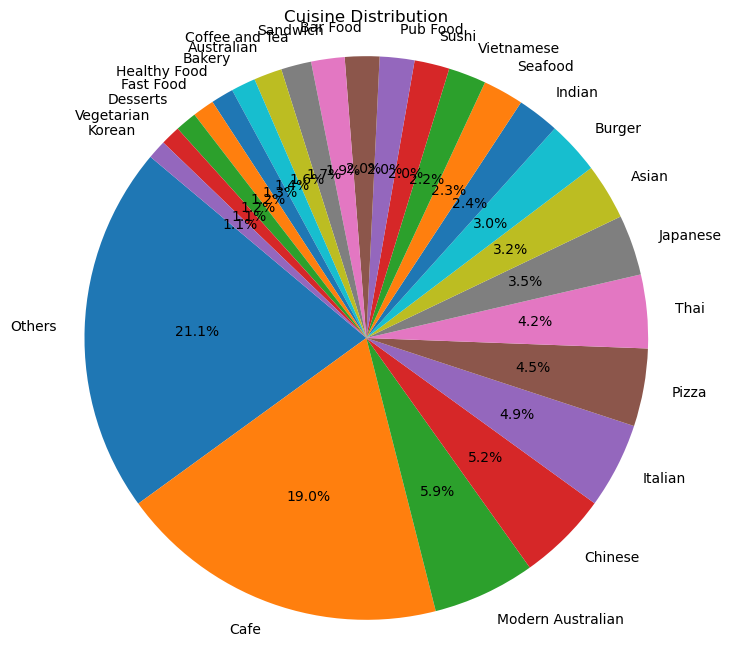

In [131]:
# get sum
total_count = cuisine_df['Count'].sum()

# percentage of each cuisine
cuisine_df['Percentage'] = cuisine_df['Count'] / total_count * 100

# cuisines with <1% are grouped as 'Others'
cuisine_df['Cuisine'] = np.where(cuisine_df['Percentage'] < 1, 'Others', cuisine_df['Cuisine'])
cuisine_df_grouped = cuisine_df.groupby('Cuisine', as_index=False).sum()
cuisine_df_grouped = cuisine_df_grouped.sort_values(by='Count', ascending=False)

# plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(cuisine_df_grouped['Count'], labels=cuisine_df_grouped['Cuisine'], autopct='%1.1f%%', startangle=140)
plt.title('Cuisine Distribution')
plt.axis('equal')
plt.show()


### which suburbs (top 3) have the highest number of restaurants?

In [132]:
# use regular expression to get suburb and count the number of restaurants in each suburb
suburb_counts = df['subzone'].str.extract(r'(?:.*,)?\s*(\w+\s*\w*)$', expand=False).value_counts()

# top 3 suburbs
top_3_suburbs = suburb_counts.head(3)

print("Top 3 suburbs:")
print(top_3_suburbs)

Top 3 suburbs:
CBD            786
Surry Hills    269
Parramatta     264
Name: subzone, dtype: int64


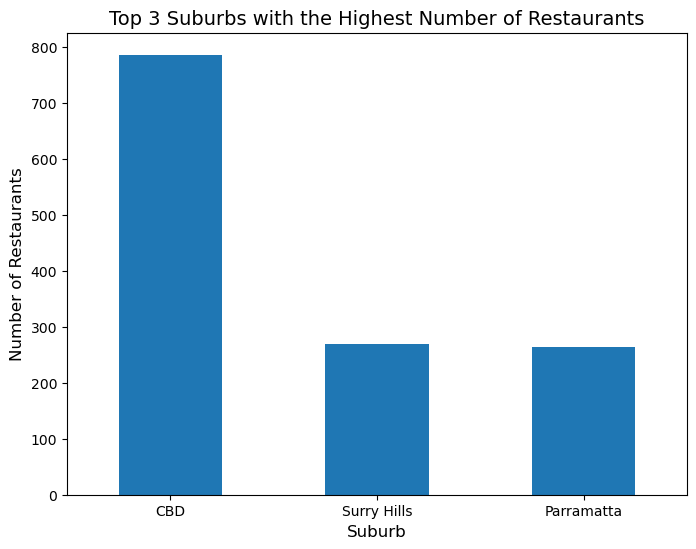

In [133]:
#bar plot
plt.figure(figsize=(8, 6)) 
top_3_suburbs.plot(kind='bar')

plt.title("Top 3 Suburbs with the Highest Number of Restaurants", fontsize=14)
plt.xlabel("Suburb", fontsize=12)
plt.xticks(rotation=0)
plt.ylabel("Number of Restaurants", fontsize=12)

plt.show()

### “Restaurants with ‘excellent’ ratings are mostly costly while those with ‘Poor’ ratings are rarely expensive”. Do you agree with this statement or not? Please support your answer with numbers and visuals. (hint: use stacked bar chart or histogram to relate ‘cost’ to 'rating_text')

In [134]:
# group the data by 'rating_text' and take the average
rating_cost = df.groupby('rating_text')['cost'].describe()
print(rating_cost)

              count        mean         std   min   25%   50%    75%    max
rating_text                                                                
Average      4420.0   51.021267   22.831674  10.0  35.0  45.0   60.0  200.0
Excellent      51.0  101.666667  113.215134  20.0  40.0  60.0  120.0  500.0
Good         1903.0   59.528114   29.533156  10.0  40.0  50.0   70.0  370.0
Poor          201.0   55.845771   23.738810  20.0  40.0  50.0   70.0  180.0
Very Good     506.0   71.515810   44.030286  15.0  45.0  60.0   80.0  300.0


By checking the mean value between 'Excellent' and 'Poor', the 'Excellent' cost is almost double compared to the 'Poor', but the standard deviation of 'Excellent' is very big. It is better to conduct a t-test.

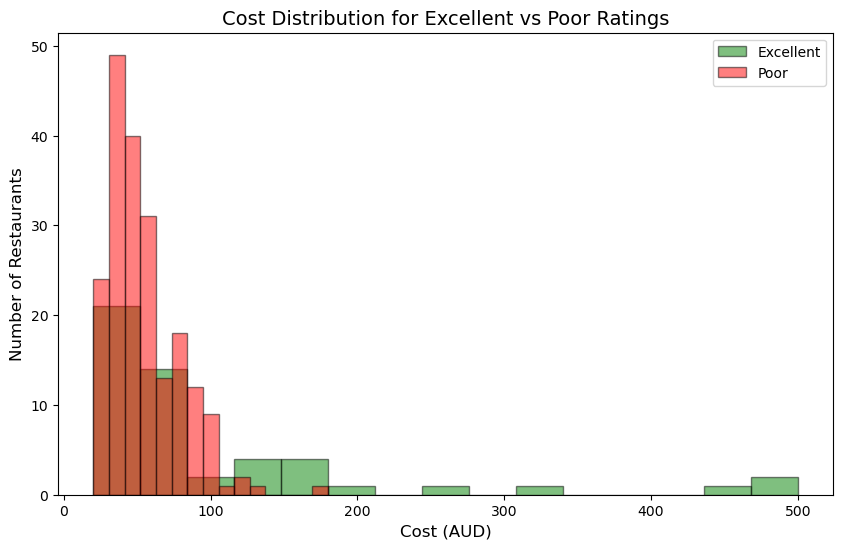

In [135]:
# 'Excellent' and 'Poor' ratings cost
excellent_cost = df[df['rating_text'] == 'Excellent']['cost']
poor_cost = df[df['rating_text'] == 'Poor']['cost']

plt.figure(figsize=(10, 6))

# Histogram for restaurants with 'Excellent' ratings and with 'Poor' ratings
plt.hist(excellent_cost, bins=15, alpha=0.5, label='Excellent', color='green', edgecolor='black')
plt.hist(poor_cost, bins=15, alpha=0.5, label='Poor', color='red', edgecolor='black')
plt.title('Cost Distribution for Excellent vs Poor Ratings', fontsize=14)
plt.xlabel('Cost (AUD)', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.legend()
plt.show()

As shown in the plot above, the cost of 'Poor' is distributed on the left side of the plot, whereas 'Excellent' is spread across the whole plot from low to high, which explains why the standard deviation is very high.

#### Hypotheses test
H₀: There is no significant difference in cost between restaurants with ‘excellent’ and ‘poor’ ratings. \
H₁: Restaurants with ‘excellent’ ratings are significantly more expensive than those with ‘poor’ ratings.\
significance level = 0.05

In [136]:
import scipy.stats as stats

# drop na for the test
cost_excellent = excellent_cost.dropna()
cost_poor = poor_cost.dropna()

# independent two-sample t-test
t_stat, p_value = stats.ttest_ind(cost_excellent, cost_poor, equal_var=False)  # Welch's t-test

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")


T-statistic: 2.8743207699879623
P-value: 0.005886509895337525


P-value < 0.05, we can reject the null hypothesis, in favour of H₁, which is restaurants with ‘excellent’ ratings are significantly more expensive than those with ‘poor’ ratings.

### Exploratory Data Analysis (EDA)

In [137]:
df.describe()

,cost,lat,lng,rating_number,votes,cost_2
count,10154.000000,10308.000000,10308.000000,7184.000000,7184.000000,10154.000000
mean,51.153240,-32.921377,148.067359,3.283672,83.581013,5.332974
std,27.799485,8.263449,26.695402,0.454580,175.117966,2.147115
min,8.000000,-37.858473,-123.270371,1.800000,4.000000,2.000000
25%,30.000000,-33.899094,151.061061,3.000000,12.000000,3.699187
50%,45.000000,-33.872741,151.172468,3.300000,32.000000,4.857724
75%,60.000000,-33.813451,151.208940,3.600000,87.000000,6.016260
max,500.000000,51.500986,152.869052,4.900000,3236.000000,40.000000


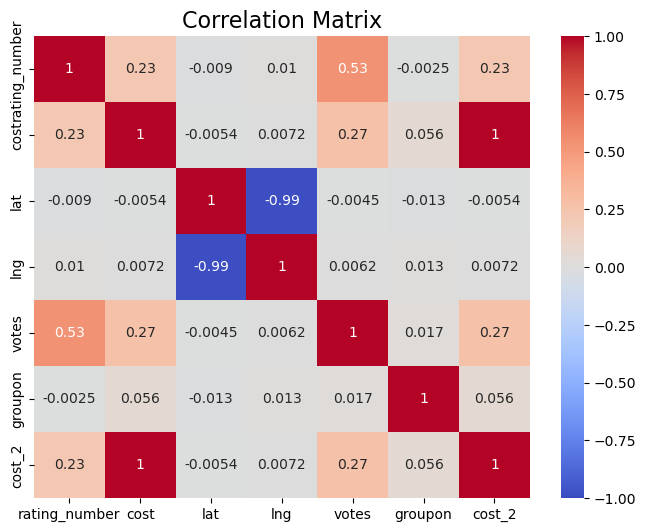

In [138]:
# reorder columns to move 'rating_number' to the beginning
cols = ['rating_number'] + [col for col in df.columns if col != 'rating_number']
df_reordered = df[cols]
# the correlation matrix
corr_matrix = df_reordered.corr()

# Plot a heatmap for the matrix
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix', fontsize=16)
plt.show()

The most correlated numerical variables to the rating number are votes (0.53) and cost (0.23), both positive, which indicates that higher cost or higher votes may lead to a higher rating number. 

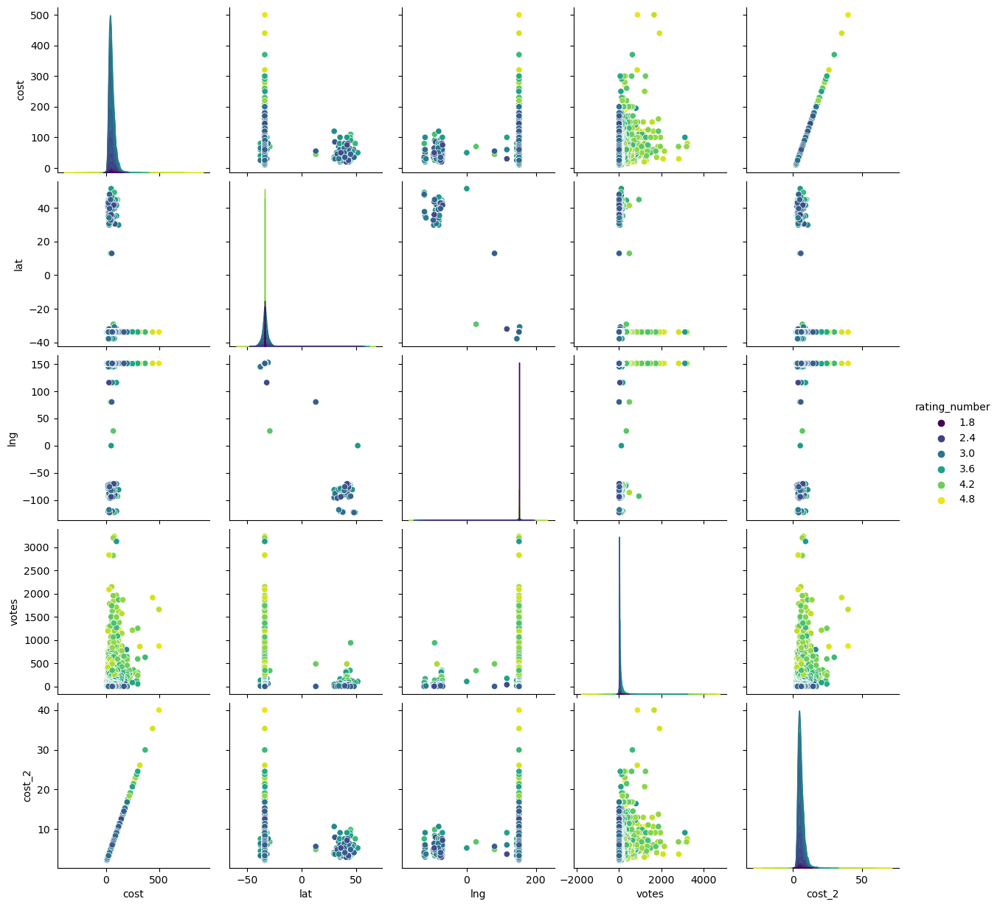

In [139]:
# only numeric columns from the DataFrame
numeric_df = df_reordered.select_dtypes(include=['number'])

# Create a pair plot
sns.pairplot(numeric_df, hue='rating_number', diag_kind='kde', palette='viridis')
plt.show()

High rating numbers are represented with lighter colors, while lower ratings are represented with darker colors. The highest votes and high costs are associated with high rating numbers.

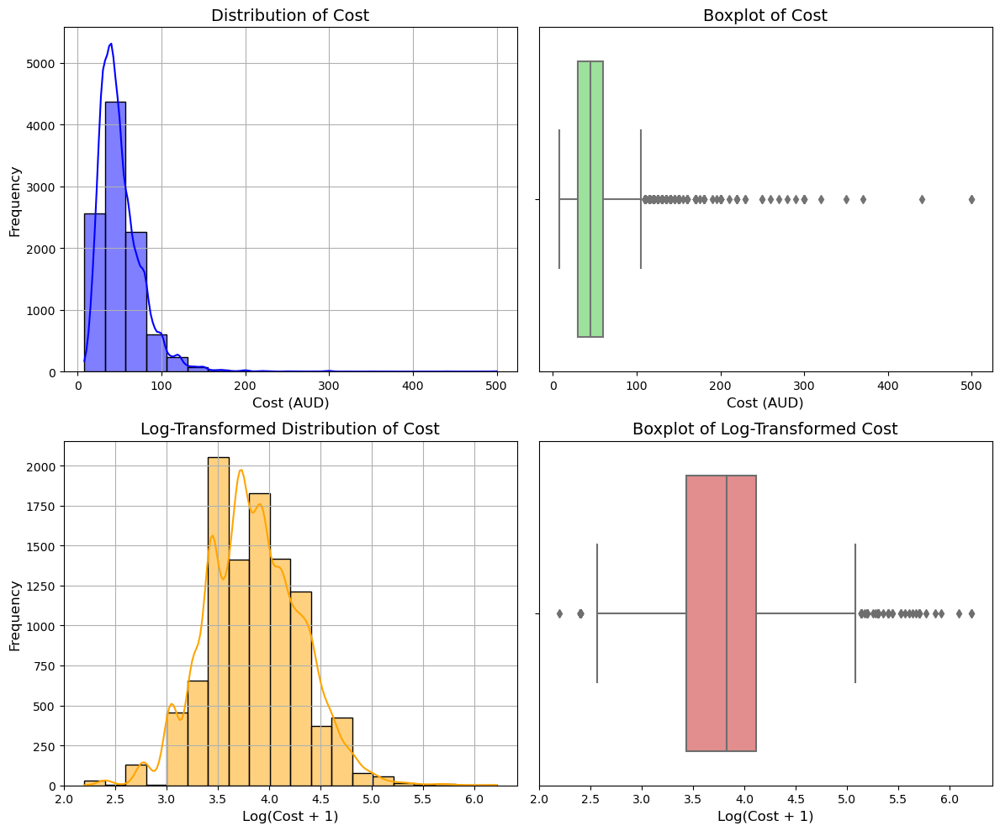

In [140]:
import numpy as np
# four subplots
plt.figure(figsize=(12, 10))

# Histogram
plt.subplot(2, 2, 1)
sns.histplot(df['cost'], bins=20, kde=True, color='blue', edgecolor='black')
plt.title('Distribution of Cost', fontsize=14)
plt.xlabel('Cost (AUD)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)

# Boxplot for original cost
plt.subplot(2, 2, 2) 
sns.boxplot(x=df['cost'], color='lightgreen', orient='h')
plt.title('Boxplot of Cost', fontsize=14)
plt.xlabel('Cost (AUD)', fontsize=12)

# Log-transformed histogram 
plt.subplot(2, 2, 3) 
sns.histplot(np.log1p(df['cost']), bins=20, kde=True, color='orange', edgecolor='black') 
plt.title('Log-Transformed Distribution of Cost', fontsize=14)
plt.xlabel('Log(Cost + 1)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)

# Boxplot for log-transformed cost
plt.subplot(2, 2, 4)  
sns.boxplot(x=np.log1p(df['cost']), color='lightcoral', orient='h')
plt.title('Boxplot of Log-Transformed Cost', fontsize=14)
plt.xlabel('Log(Cost + 1)', fontsize=12)
plt.tight_layout()
plt.show()


Most costs are distributed between 8 and 100, but there are some very large values. The original plot is heavily skewed to the right side, which is not good for model prediction. A log transformation may be considered. After the log transformation, the data has pulled back to almost a normal distribution.

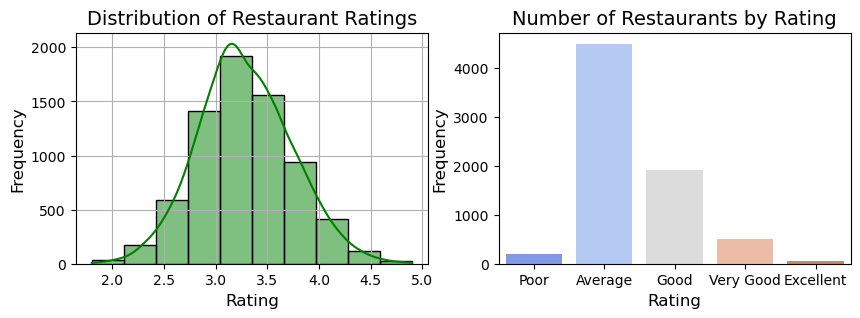

In [141]:
# four subplots
plt.figure(figsize=(10, 3))

# histogram for 'rating'
plt.subplot(1, 2, 1)
sns.histplot(df['rating_number'], bins=10, kde=True, color='green', edgecolor='black')
plt.title('Distribution of Restaurant Ratings', fontsize=14)
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True)


rating_order = ['Poor', 'Average', 'Good', 'Very Good', 'Excellent']

# count each rating category
rating_counts = df['rating_text'].value_counts().reindex(rating_order)

# bar plot
plt.subplot(1, 2, 2)
sns.barplot(x=rating_counts.index, y=rating_counts.values, palette='coolwarm')
plt.xticks(rotation=0)
plt.title(f'Number of Restaurants by Rating', fontsize=14)
plt.xlabel('Rating', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.show()
plt.show()

The rating is almost normally distributed, which is ready for model fitting. For the rating_text, the majority are 'Average,' followed by 'Good.' If a classifier model will be fitted later on, it may be necessary to check the balance between the groups.

## Produce Cuisine Density Map

<Figure size 1000x800 with 0 Axes>

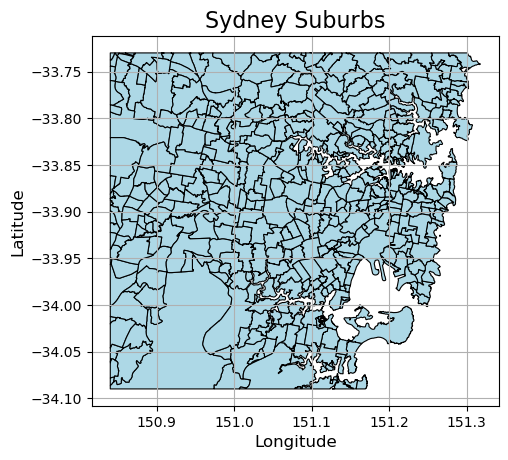

In [142]:
sydney_geo = gpd.read_file('data/sydney.geojson')

# check the GeoJSON file
plt.figure(figsize=(10, 8))
sydney_geo.plot(edgecolor='black', color='lightblue', linewidth=0.8)
plt.title('Sydney Suburbs', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True)
plt.show()

In [143]:
def plot_cuisine_density_map(selected_cuisine = 'Chinese'):
    """
    Plots a cuisine density map in which each suburb is colour-coded by the number of restaurants that serve a particular cuisine.

    Parameters:
    selected_cuisine: Cuisine to filter for, e.g., 'Chinese','India'....
    """
    # load the sydney data
    sydney_geo = gpd.read_file('data/sydney.geojson')
    # make the df into geodataframe
    gdf_restaurants = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['lng'], df['lat']), crs="EPSG:4326")
    # filiter the cuisine default is Chinese
    gdf_filtered = gdf_restaurants[gdf_restaurants['cuisine'].apply(lambda x: selected_cuisine in x)]
    # use spatial join to join sydney_geo into the restaurant.
    gdf_joined = gpd.sjoin(gdf_filtered, sydney_geo, how='left')
    # get the count of each area grouped by SSC_NAME and count
    cuisine_density = gdf_joined.groupby('SSC_NAME').size().reset_index(name='restaurant_count')
    # then join back to the sydney map
    sydney_geo = sydney_geo.merge(cuisine_density, how='left', left_on='SSC_NAME', right_on='SSC_NAME')

    # define colormap, from light red to dark red
    cmap = plt.get_cmap('Reds') 
    # get boundaries based on the range of restaurant counts from the min and max
    min_count = int(sydney_geo['restaurant_count'].min())
    max_count = int(sydney_geo['restaurant_count'].max())
    boundaries = list(range(min_count, max_count + 1))
    
    # make sure boundaries are within the range of colormap
    if len(boundaries) > cmap.N:
        boundaries = [min_count] + list(range(min_count + 1, max_count + 1, (max_count - min_count) // (cmap.N - 1))) + [max_count]
    norm = mcolors.BoundaryNorm(boundaries, cmap.N)

    # Plot the cuisine density map
    # if it is na, fill 0
    sydney_geo['restaurant_count'] = sydney_geo['restaurant_count'].fillna(0)
    plt.figure(figsize=(12, 10))
    sydney_geo.plot(column='restaurant_count', cmap=cmap, norm=norm, edgecolor='black', linewidth=0.5, legend=True,
                    missing_kwds={"color": "white", "label": "No Data"})
    plt.title(f'{selected_cuisine} Restaurant Density Map in Sydney', fontsize=16)
    plt.axis('off')
    plt.show()

<Figure size 1200x1000 with 0 Axes>

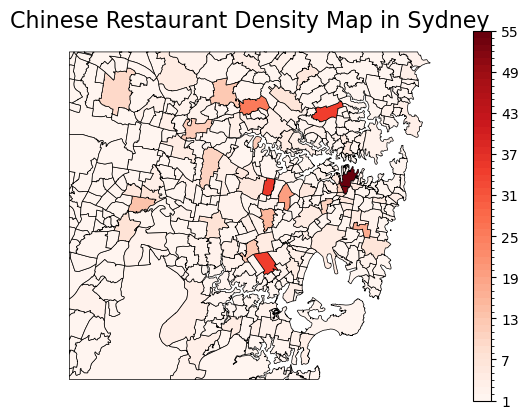

In [144]:
plot_cuisine_density_map()

We can see the most Chinese restaurant are in CBD and Haymarket area where are chinatown located. 

<Figure size 1200x1000 with 0 Axes>

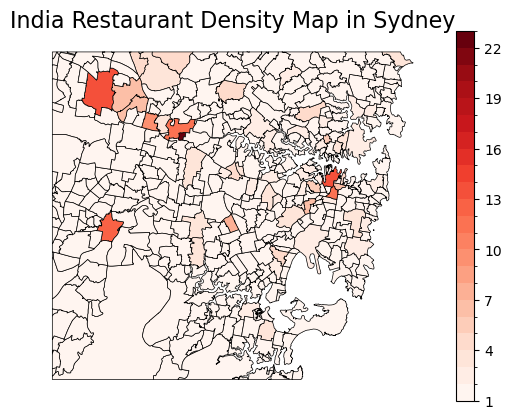

In [145]:
plot_cuisine_density_map('India')

## Interactive plotting

In [146]:
gdf_restaurants = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df['lng'], df['lat']), crs="EPSG:4326")
gdf_joined = gpd.sjoin(gdf_restaurants, sydney_geo, how='left')
cuisine_density = gdf_joined.groupby('SSC_NAME')['subzone'].count().reset_index(name='restaurant_count')
sydney_geo = sydney_geo.merge(cuisine_density, how='left', left_on='SSC_NAME', right_on='SSC_NAME')

# create interactive map with index as locations
fig = px.choropleth_mapbox(
    sydney_geo,
    geojson=sydney_geo.geometry,
    locations=sydney_geo.index,
    color='restaurant_count',
    color_continuous_scale="Reds",
    range_color=[sydney_geo['restaurant_count'].min(), sydney_geo['restaurant_count'].max()],
    mapbox_style="carto-positron",
    center={"lat": -33.8688, "lon": 151.2093},
    zoom=10,
    title='Restaurant Density in Sydney',
    labels={'restaurant_count': 'Number of Restaurants'},
    hover_data={'SSC_NAME': True, 'restaurant_count': True}  # Add SSC_NAME and restaurant count to hover
)

# customize hover template to display SSC_NAME
fig.update_traces(
    hovertemplate="<b>%{customdata[0]}</b><br>Restaurant Count: %{customdata[1]}<extra></extra>"
)

fig.update_layout(margin={"r":0,"t":40,"l":0,"b":0})
fig.show()

In our case, the normal plot will only show the relative density (light red to dark red), but it does not show the actual numbers; it also does not show the actual suburb names. For example, if I want to find food to eat and I am not in the CBD, I want to know which suburb that is close to me has many choices. These can be done for interactive plotting, it can also be zoomed in if you want to see more information.

# Part B -Predictive Modelling

## Feature Engineering

### Cleaning/impute NAs

In [147]:
# check all data type and NAs
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10500 entries, 0 to 10499
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   address        10500 non-null  object 
 1   cost           10154 non-null  float64
 2   cuisine        10500 non-null  object 
 3   lat            10308 non-null  float64
 4   link           10500 non-null  object 
 5   lng            10308 non-null  float64
 6   phone          10500 non-null  object 
 7   rating_number  7184 non-null   float64
 8   rating_text    7184 non-null   object 
 9   subzone        10500 non-null  object 
 10  title          10500 non-null  object 
 11  type           10452 non-null  object 
 12  votes          7184 non-null   float64
 13  groupon        10500 non-null  bool   
 14  color          10500 non-null  object 
 15  cost_2         10154 non-null  float64
 16  cuisine_color  10500 non-null  object 
dtypes: bool(1), float64(6), object(10)
memory usage: 1

In [148]:
#missing values count and percentage
na_count = df.isna().sum()
na_percentage = round((df.isna().sum() / len(df)) * 100,2)
na_summary = pd.DataFrame({'Missing Count': na_count, 'Missing Percentage (%)': na_percentage})
print(na_summary)


               Missing Count  Missing Percentage (%)
address                    0                    0.00
cost                     346                    3.30
cuisine                    0                    0.00
lat                      192                    1.83
link                       0                    0.00
lng                      192                    1.83
phone                      0                    0.00
rating_number           3316                   31.58
rating_text             3316                   31.58
subzone                    0                    0.00
title                      0                    0.00
type                      48                    0.46
votes                   3316                   31.58
groupon                    0                    0.00
color                      0                    0.00
cost_2                   346                    3.30
cuisine_color              0                    0.00


Around 31.5% of rating_number, rating_text, and votes are missing. Since rating_number and rating_text are our dependent variables for the prediction model, there is no method to impute them. The best option would be to drop the NAs from these three columns. The missing count of these three columns is exactly the same, and a missing data matrix will be used to further explore the relationships between them.

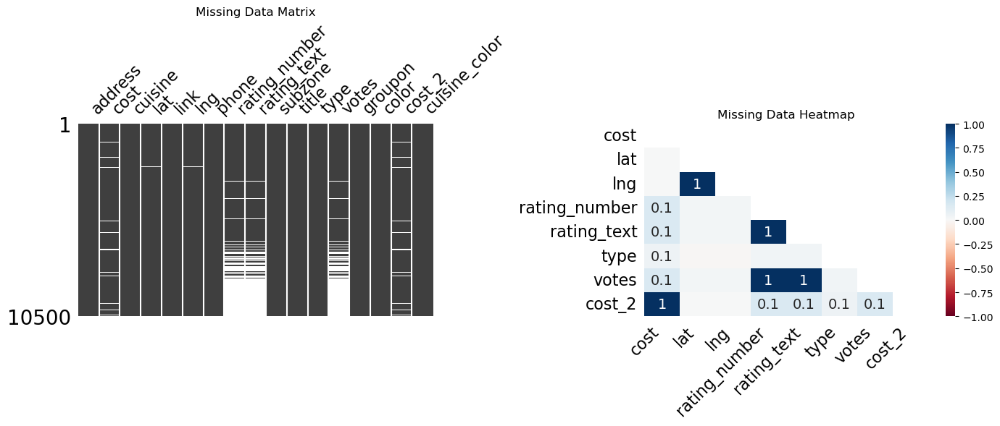

In [149]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# missing data matrix
msno.matrix(df, ax=axes[0])
axes[0].set_title('Missing Data Matrix')

# correlation heatmap for missing data
msno.heatmap(df, ax=axes[1])
axes[1].set_title('Missing Data Heatmap')
plt.tight_layout()
plt.show()

The above shows which features are often missing together, for example, latitude (lat) and longitude (lng), cost and cost_2, and votes vs. rating_number and rating_text. Missing latitude and longitude could be due to missing location data. Cost and cost_2 are randomly missing, which is probably due to incomplete customer data collection. Votes vs. rating_number and rating_text are missing together, as discovered in a previous step, likely because votes are missing, and customers have not rated or placed an order for the restaurant. Since rating_number is the target variable, we cannot impute this data, so we need to remove all NAs from the rating_number column.

In [150]:
df_drop_na = df.dropna(subset=['rating_number'])
print(df_drop_na.isna().sum())

address            0
cost             103
cuisine            0
lat              115
link               0
lng              115
phone              0
rating_number      0
rating_text        0
subzone            0
title              0
type              21
votes              0
groupon            0
color              0
cost_2           103
cuisine_color      0
dtype: int64


#### Missing value imputation

In [151]:
# impute the cost group by same subzone and cuisine and type
grouped_cost = df.groupby(['subzone', 'cuisine','type'])['cost'].transform('mean')
# fill NaN with the average
df_drop_na['cost'] = df_drop_na['cost'].fillna(grouped_cost)
# if there are more na, impute the cost group by same subzone and cuisine, level up
grouped_cost_sub_cuis = df.groupby(['subzone', 'cuisine'])['cost'].transform('mean')
df_drop_na['cost'] = df_drop_na['cost'].fillna(grouped_cost_sub_cuis)
# if there are more na, impute the cost group by same subzone, level up
grouped_cost_sub = df.groupby(['subzone'])['cost'].transform('mean')
df_drop_na['cost'] = df_drop_na['cost'].fillna(grouped_cost_sub)
# impute the cost group by same subzone
print(df_drop_na.isna().sum())


address            0
cost               0
cuisine            0
lat              115
link               0
lng              115
phone              0
rating_number      0
rating_text        0
subzone            0
title              0
type              21
votes              0
groupon            0
color              0
cost_2           103
cuisine_color      0
dtype: int64


In [152]:
#Group by 'subzone' and calculate the median lat and lng for each subzone
grouped_means_lat = df.groupby('subzone')['lat'].transform('median')
grouped_means_lng = df.groupby('subzone')['lng'].transform('median')

df_drop_na['lat'] = df_drop_na['lat'].fillna(grouped_means_lat)
df_drop_na['lng'] = df_drop_na['lng'].fillna(grouped_means_lng)

print(df_drop_na.isna().sum())

address            0
cost               0
cuisine            0
lat               14
link               0
lng               14
phone              0
rating_number      0
rating_text        0
subzone            0
title              0
type              21
votes              0
groupon            0
color              0
cost_2           103
cuisine_color      0
dtype: int64


Except the cost_2, there are still some missing value, which will be droped.

In [153]:
# delete the cost_2 first as it is same as cost
df_drop_na = df_drop_na.drop('cost_2',axis=1)
# then dorp the rest na
df_no_na = df_drop_na.dropna()
print(df_no_na.shape)

(7149, 16)


#### Drop all not meaningful columns

In [154]:
df_ready = df_no_na.drop(['address', 'link', 'phone', 'title', 'color', 'cuisine_color'], axis=1)
print(df_ready.shape)

(7149, 10)


#### Adding distance to CBD feature

The reason for adding the distance between the CBD center and the restaurant is that good restaurants are likely to be located in good locations, which are usually close to the CBD area.

In [155]:
import numpy as np

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Calculate the Haversine distance between two points on the Earth's surface.
    
    Parameters:
    - lat1, lon1: Latitude and longitude of the first point.
    - lat2, lon2: Latitude and longitude of the second point.

    Returns:
    - Distance in kilometers.
    """
    # radius of Earth
    R = 6371 

    # convert degrees to radians
    phi1, phi2 = np.deg2rad(lat1), np.deg2rad(lat2)
    delta_phi = np.deg2rad(lat2 - lat1)
    delta_lambda = np.deg2rad(lon2 - lon1)
    
    a = np.sin(delta_phi / 2) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(delta_lambda / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    distance = R * c
    
    return distance

# set central point coordinates which is same to the plot
center_lat = -33.8688
center_lon = 151.2093

# Calculate distances from the central point
df_ready['distance_from_center'] = df_ready.apply(lambda row: haversine_distance(center_lat, center_lon, row['lat'], row['lng']), axis=1)

#### Change the groupon feature to a boolean type

In [156]:
# Convert 'groupon' column from boolean to numeric
df_ready['groupon'] = df_ready['groupon'].astype(int)

#### One hot encoder to cuisine feature

In [157]:
import ast

# change the row to actual list
df_ready['cuisine_list'] = df['cuisine'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
# explode the list into multiple rows
df_exploded = df_ready.explode('cuisine_list')

# apply pd.get_dummies to the 'cuisine_list' column
df_encoded = pd.get_dummies(df_exploded['cuisine_list'], prefix=None)
df_encoded = df_encoded.groupby(level=0).sum()

# combine the one-hot encoded features with the original data
df_combined = pd.concat([df_ready, df_encoded], axis=1)

# output the resulting DataFrame
print(df_combined.columns)

Index(['cost', 'cuisine', 'lat', 'lng', 'rating_number', 'rating_text',
       'subzone', 'type', 'votes', 'groupon',
       ...
       'Teppanyaki', 'Teriyaki', 'Tex-Mex', 'Thai', 'Tibetan', 'Turkish',
       'Vegan', 'Vegetarian', 'Vietnamese', 'Yum Cha'],
      dtype='object', length=140)


#### One hot encoder to suburb

In [158]:
from sklearn.preprocessing import OneHotEncoder

df_combined = gpd.GeoDataFrame(df_combined, 
                                       geometry=gpd.points_from_xy(df_combined['lng'], df_combined['lat']),
                                       crs="EPSG:4326")
# left join on SSC_NAME
merged_df = gpd.sjoin(df_combined, sydney_geo, how='left')
merged_df = merged_df.reset_index(drop=True)

# initialize OneHotEncoder drop='first' to avoid dummy
encoder = OneHotEncoder(sparse_output=False, drop='first')

# fit and transform the 'SSC_NAME' column
encoded_ssc_name = encoder.fit_transform(merged_df[['SSC_NAME']])

# create a DataFrame from the encoded data
encoded_ssc_name_df = pd.DataFrame(encoded_ssc_name, columns=encoder.get_feature_names_out(['SSC_NAME']))

# combine the one-hot encoded features with the merged DataFrame
final_df = pd.concat([merged_df, encoded_ssc_name_df], axis=1)
final_df = final_df.drop(['SSC_CODE','CONF_VALUE','SQKM','geometry','restaurant_count','lat','lng','subzone','cuisine_list'], axis = 1)
# Output the resulting DataFrame
print(final_df.columns)

Index(['cost', 'cuisine', 'rating_number', 'rating_text', 'type', 'votes',
       'groupon', 'distance_from_center', 'Afghani', 'African',
       ...
       'SSC_NAME_Woollahra', 'SSC_NAME_Woolloomooloo', 'SSC_NAME_Woolooware',
       'SSC_NAME_Woolwich', 'SSC_NAME_Woronora', 'SSC_NAME_Yagoona',
       'SSC_NAME_Yarrawarrah', 'SSC_NAME_Yowie Bay', 'SSC_NAME_Zetland',
       'SSC_NAME_nan'],
      dtype='object', length=498)


#### One hot encoder to type

In [159]:
final_df['type_ls'] = final_df['type'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
df_exploded_t = final_df.explode('type_ls')
df_encoded_t = pd.get_dummies(df_exploded_t['type_ls'], prefix=None)
df_encoded_t = df_encoded_t.groupby(level=0).sum()

# 3. Combine the one-hot encoded features with the original data
final_df = pd.concat([final_df, df_encoded_t], axis=1)

# Output the resulting DataFrame
print(final_df.columns)

final_df =final_df.drop(['type','type_ls','cuisine'],axis=1)

Index(['cost', 'cuisine', 'rating_number', 'rating_text', 'type', 'votes',
       'groupon', 'distance_from_center', 'Afghani', 'African',
       ...
       'Café', 'Casual Dining', 'Club', 'Dessert Parlour', 'Fast Food',
       'Fine Dining', 'Food Court', 'Food Truck', 'Pub', 'Wine Bar'],
      dtype='object', length=512)


## Regression

In [160]:
#splilt the data into train and test
# 80% traininf and 20% testing
final_df_num = final_df.select_dtypes(include=['number'])
final_df_num = final_df_num.dropna()
X = final_df_num.drop(columns=['rating_number'])
y = final_df_num['rating_number'] 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# take the StandardScaler for all feature
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#Keep 95% of the variance by PCA
pca = PCA(n_components=0.95)  # Keep 95% of the variance
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

### linear regression model

In [161]:
# Fit the Linear Regression model
model_regression_1 = LinearRegression()
model_regression_1.fit(X_train_pca, y_train)

# Predict on the test set
y_pred = model_regression_1.predict(X_test_pca)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
print(f'R² Score: {round(r2, 6)}')
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {round(mse, 6)}')

R² Score: 0.255571
Mean Squared Error: 0.15123


### Stochastic Gradient Descent(SDG)
SGD only selects a single training example (or a small mini-batch) for each update compare the batch gradient descent.

In [162]:
#  create a Gradient Descent Linear Regression
model_regression_2 = SGDRegressor(loss='squared_error',
                             learning_rate='constant',
                             eta0 = 0.00005,
                             max_iter = 1000000,
                             random_state = 0,
                             early_stopping = False,
                             n_iter_no_change = 10,
                             warm_start = True)

model_regression_2.fit(X_train_pca, y_train)

y_pred_sgd = model_regression_2.predict(X_test_pca)

r2_sgd = r2_score(y_test, y_pred_sgd)
print(f'R² Score using Gradient Descent (SGD): {round(r2_sgd,6)}')

mse = mean_squared_error(y_test, y_pred_sgd)
print(f'Mean Squared Error: {round(mse,6)}')

R² Score using Gradient Descent (SGD): 0.255681
Mean Squared Error: 0.151208


Compare the linear regression model and Stochastic Gradient Descent (SGD); there is no significant difference, and SGD is slightly better than the linear regression model, which minimizes the residual sum of squares between the observed targets in the dataset. This may indicate that our data may not be suitable for a linear model.

## Classification

In [163]:
# Define a mapping for the ratings
rating_mapping = {
    'Poor': 1,  
    'Average': 1,    
    'Good': 2,        
    'Very Good': 2, 
    'Excellent': 2   
}

final_df['rating_class'] = final_df['rating_text'].map(rating_mapping)

### Logistic Regression Model

In [164]:
missing_values = final_df.isna().sum()
columns_with_na = missing_values[missing_values > 0]
print(columns_with_na)

index_right    707
SSC_NAME       707
dtype: int64


Accuracy: 100.00%
Confusion Matrix:
[[953   0]
 [  0 477]]


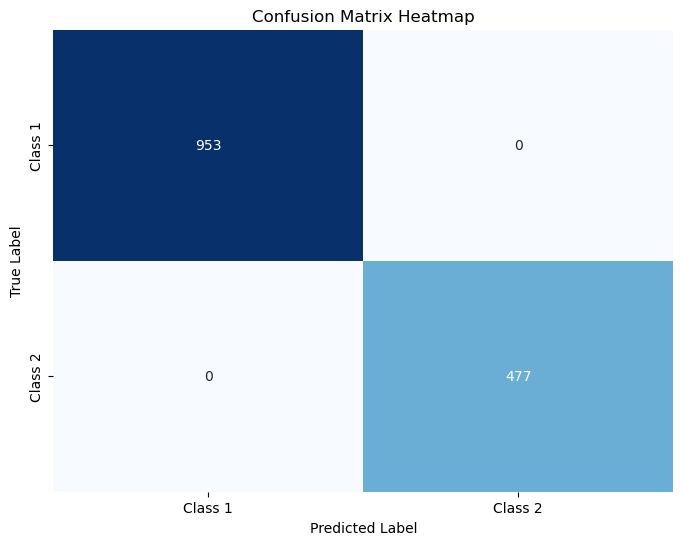

Classification Report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00       953
           2       1.00      1.00      1.00       477

    accuracy                           1.00      1430
   macro avg       1.00      1.00      1.00      1430
weighted avg       1.00      1.00      1.00      1430



In [165]:
# drop the columns which found has NAs
final_df_class = final_df.drop(['index_right','SSC_NAME'],axis=1)
# select the numerical columns(just in case)
X = final_df_class.drop(columns=['rating_number','rating_text']).select_dtypes(include=['number'])
y = final_df_class['rating_class']
#split into 80% training 20%testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# taking pca
# Keep 95% of the variance
pca = PCA(n_components=0.99) 
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)
# using logistic regression
model_3 = LogisticRegression()
model_3.fit(X_train_pca, y_train)
y_pred = model_3.predict(X_test_pca)
# get the accuracy, consusion matrix
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)
print(f'Accuracy: {accuracy*100:.2f}%')
print('Confusion Matrix:')
print(conf_matrix)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Class 1', 'Class 2'], yticklabels=['Class 1', 'Class 2'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix Heatmap')
plt.show()
print('Classification Report:')
print(class_report)

### Neural Network Classifier

In [166]:
mlp = MLPClassifier()
mlp.fit(X_train_scaled, y_train)
y_pred_mlp = mlp.predict(X_test_scaled)
accuracy_mlp = accuracy_score(y_test, y_pred_mlp)
conf_matrix_mlp = confusion_matrix(y_test, y_pred_mlp)
print(f'Accuracy: {accuracy_mlp * 100:.2f}%')
print('Confusion Matrix:')
print(conf_matrix_mlp)
class_report = classification_report(y_test, y_pred_mlp)
print('Classification Report:')
print(class_report)


Accuracy: 98.04%
Confusion Matrix:
[[945   8]
 [ 20 457]]
Classification Report:
              precision    recall  f1-score   support

           1       0.98      0.99      0.99       953
           2       0.98      0.96      0.97       477

    accuracy                           0.98      1430
   macro avg       0.98      0.97      0.98      1430
weighted avg       0.98      0.98      0.98      1430



Logistic regression using 99% of the variance explained by PCA gives the best result, with 100% accuracy. By checking the confusion matrix, all testing data have been correctly labeled. This is an unbalanced dataset in terms of classes, with more samples in class 1 than in class 2. To prevent the model from having bias, the classification report needs to be checked, especially when accuracy is not 100%.

A neural network classifier was fitted for comparison. The MLPClassifier has an accuracy of 98.11%. The F1-score for class 1 is 0.99 and for class 2 is 0.97, which indicates that the model predicts class 1 better than class 2 due to the unbalanced dataset. A neural network is a more complex model than logistic regression, but it performs worse than simple logistic regression. This is an example of when a simple model outperforms a complex model.